In [ ]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.optimizers import Adam

(x_train, y_train), (x_test, y_test) = datasets.cifar10.load_data()

# нормалізація даних
x_train, x_test = x_train / 255.0, x_test / 255.0

y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)

# архітектура нейромережі на основі VGG16
model = models.Sequential([
    layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),


    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(10, activation='softmax')
])

# компіляція моделі
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# навчання моделі
history = model.fit(x_train, y_train, epochs=20,
                    validation_data=(x_test, y_test),
                    batch_size=32)

# оцінка точності моделі
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"Точність спрощеної VGG16 НМ: {test_acc:.4f}")

# збереження моделі з мінімізацією розміру
model.save('vgg16_simplified2.h5', include_optimizer=False)
from google.colab import files
files.download('vgg16_simplified2.h5')





170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 21s 9ms/step - accuracy: 0.3568 - loss: 1.7622 - val_accuracy: 0.5546 - val_loss: 1.2644
Epoch 2/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.5683 - loss: 1.2204 - val_accuracy: 0.6166 - val_loss: 1.0907
Epoch 3/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.6452 - loss: 1.0199 - val_accuracy: 0.6494 - val_loss: 0.9938
Epoch 4/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.6876 - loss: 0.9013 - val_accuracy: 0.6916 - val_loss: 0.8864
Epoch 5/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - accuracy: 0.7267 - loss: 0.7986 - val_accuracy: 0.7044 - val_loss: 0.8506
Epoch 6/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.7513 - loss: 0.7177 - val_accuracy: 0.7204 - val_loss: 0.8067
Epoch 7/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.7786 - loss: 0.6472 - val_accuracy: 0.7411 - val_loss: 0.7727
Epoch 8/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.7974 - loss: 0

Точність спрощеної VGG16 НМ: 0.7498


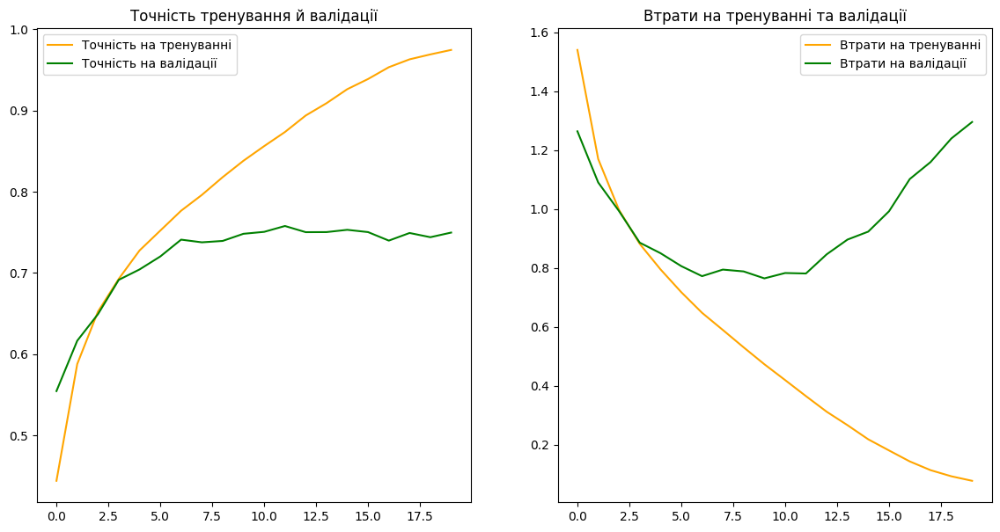

In [ ]:
import matplotlib.pyplot as plt

# створення графіків точності й втрат
def plot_accuracy_loss(history, test_loss, test_acc):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.figure(figsize=(14, 7))

    # графік точності
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'orange', label='Точність на тренуванні')
    plt.plot(epochs, val_acc, 'green', label='Точність на валідації')
    plt.title('Точність тренування й валідації')
    plt.legend()

    # графік втрат
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'orange', label='Втрати на тренуванні')
    plt.plot(epochs, val_loss, 'green', label='Втрати на валідації')
    plt.title('Втрати на тренуванні та валідації')
    plt.legend()

    plt.show()

# відображення результатів
plot_accuracy_loss(history, test_loss, test_acc)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


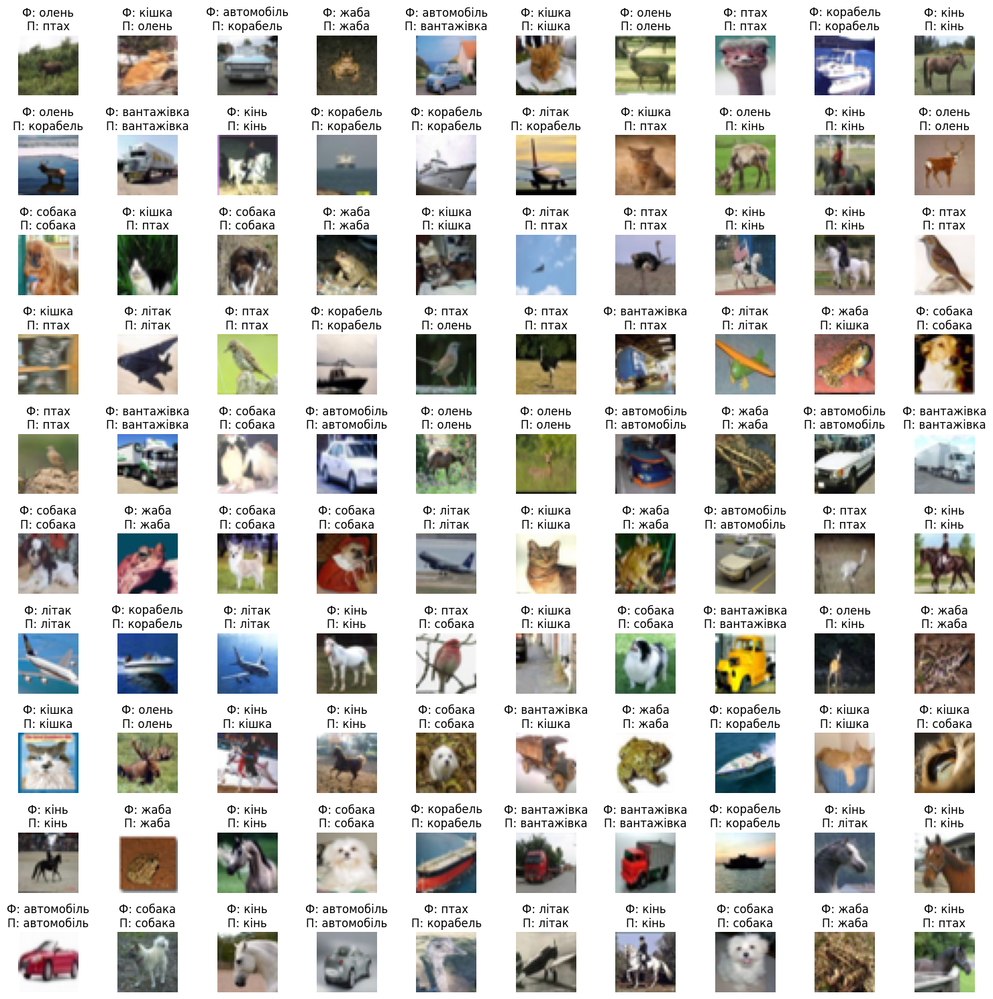

Точність на вибіркових зображеннях: 78.0 %


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# назв класів cifar10
class_labels = ['літак', 'автомобіль', 'птах', 'кішка', 'олень', 'собака', 'жаба', 'кінь', 'корабель', 'вантажівка']

# вибір 100 випадкових зображень із тестової вибірки у cifar10
indices = np.random.choice(len(x_test), 100, replace=False)
sample_images = x_test[indices]
sample_labels = np.argmax(y_test[indices], axis=1)

# Прогнозування міток для цих зображень за допомогою моделі
predictions = model.predict(sample_images)
predicted_labels = np.argmax(predictions, axis=1)

# Виведення зображень та передбачень
fig, axes = plt.subplots(10, 10, figsize=(15, 15))
axes = axes.flatten()

for i, (image, true_label, predicted_label) in enumerate(zip(sample_images, sample_labels, predicted_labels)):
    axes[i].imshow(image)
    true_class = class_labels[true_label]
    predicted_class = class_labels[predicted_label]
    axes[i].set_title(f"Ф: {true_class}\nП: {predicted_class}") # П-прогнозування, Ф-фактичне на картинці
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# розрахунок точності прогнозу на отриманних  зображеннях
correct_predictions = np.sum(predicted_labels == sample_labels)
total_predictions = len(sample_labels)
accuracy_on_sample = correct_predictions / total_predictions

# виведення точності прогнозу на зразках
print(f"Точність на вибіркових зображеннях: {accuracy_on_sample * 100:.1f} %")



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model.save('/content/drive/MyDrive/model2_vgg16.keras')


In [2]:
from tensorflow.keras.models import load_model

model = load_model('/content/drive/MyDrive/model2_vgg16.keras')


In [ ]:
from google.colab import files
files.download('/content/drive/MyDrive/model2_vgg16.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Опрацювання зображення

Saving cat1.jpg to cat1.jpg
Saving cat2.jpg to cat2.jpg
Saving cat3.jpg to cat3.jpg
Saving cat4.jpg to cat4.jpg
Saving cat5.jpg to cat5.jpg
Saving cat6.jpg to cat6.jpg
Saving deer1.jpg to deer1.jpg
Saving deer2.jpg to deer2.jpg
Saving deer3.jpg to deer3.jpg
Saving deer4.jpg to deer4.jpg
Saving deer5.jpg to deer5.jpg
Saving deer6.jpg to deer6.jpg
Saving deer7.jpg to deer7.jpg
Saving dog1.jpg to dog1.jpg
Saving dog2.jpg to dog2.jpg
Saving dog3.jpg to dog3.jpg
Saving dog4.jpg to dog4.jpg
Saving dog5.jpg to dog5.jpg
Saving dog6.jpg to dog6.jpg
Saving frog1.jpg to frog1.jpg
Saving frog2.jpg to frog2.jpg
Saving frog3.jpg to frog3.jpg
Saving frog4.jpg to frog4.jpg
Saving frog5.jpg to frog5.jpg
Saving frog6.jpg to frog6.jpg
Saving horse1.jpg to horse1.jpg
Saving horse2.jpg to horse2.jpg


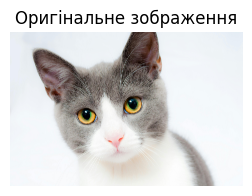

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 741ms/step
Впевненість середня (79.93%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


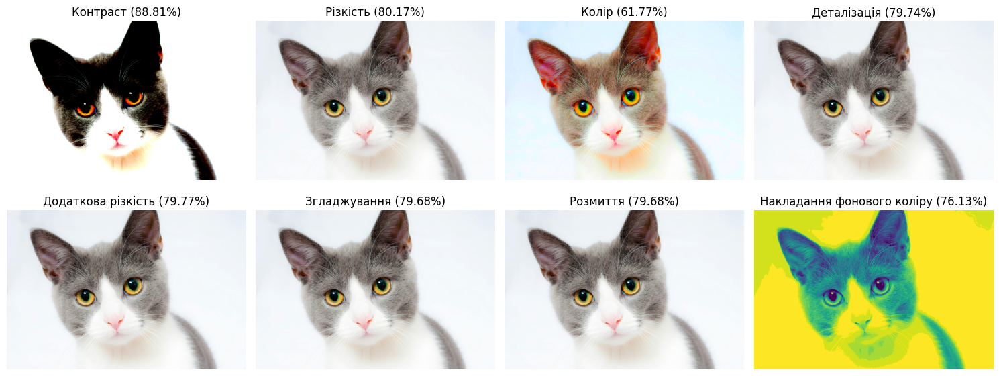

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Фільтр 'Контраст' допоміг: собака із вірогідністю 88.81%


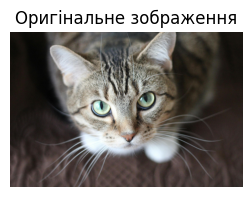

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено кішка із вірогідністю у 99.85%


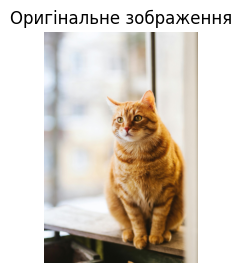

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено кішка із вірогідністю у 99.96%


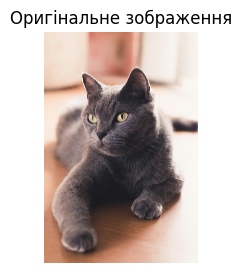

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Впевненість середня (52.52%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


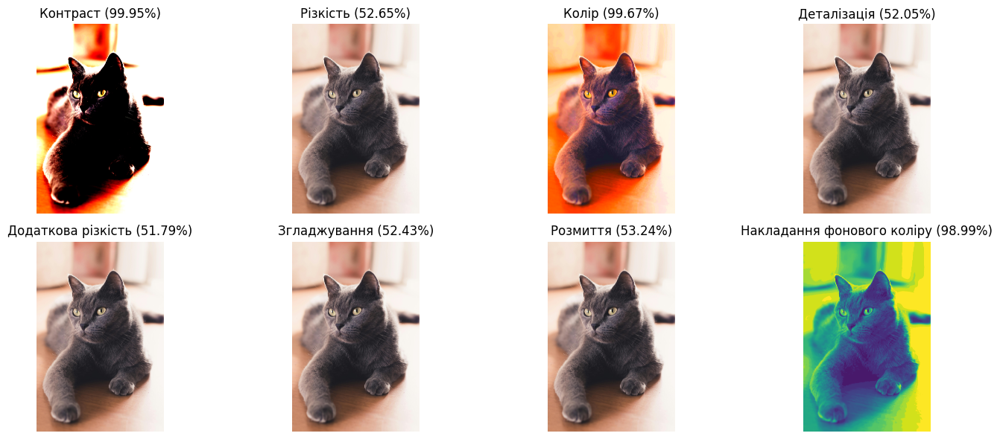

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Фільтр 'Контраст' допоміг: жаба із вірогідністю 99.95%


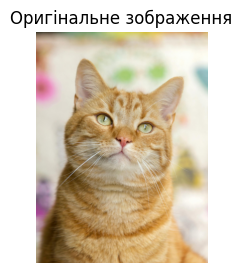

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Впевненість середня (61.12%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


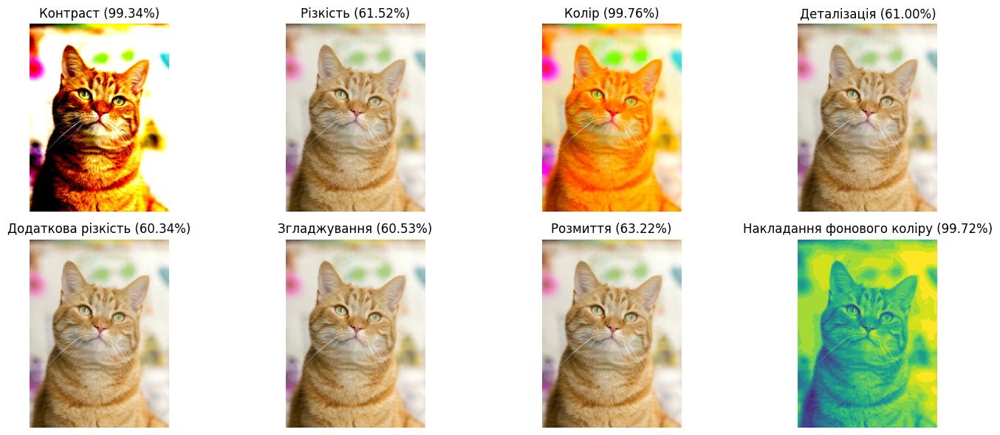

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Фільтр 'Контраст' допоміг: кішка із вірогідністю 99.34%


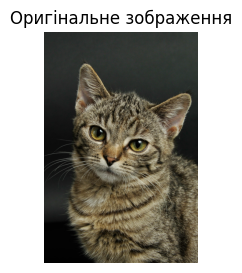

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено жаба із вірогідністю у 99.98%


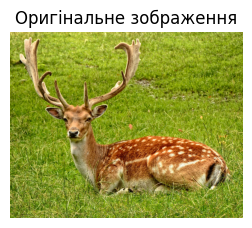

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
На картинці зображено олень із вірогідністю у 100.00%


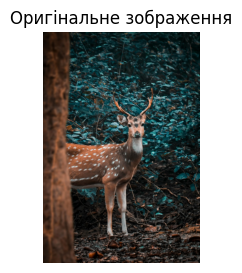

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
На картинці зображено олень із вірогідністю у 99.93%


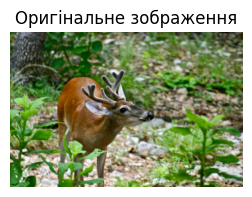

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
На картинці зображено птах із вірогідністю у 93.57%


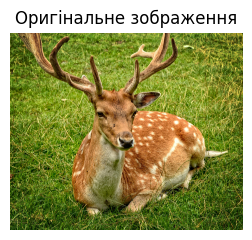

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено олень із вірогідністю у 99.95%


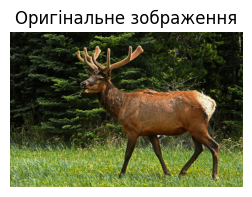

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
На картинці зображено олень із вірогідністю у 99.44%


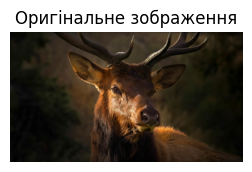

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено олень із вірогідністю у 99.02%


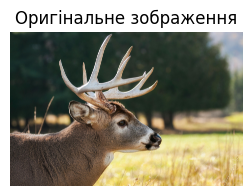

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
На картинці зображено олень із вірогідністю у 97.42%


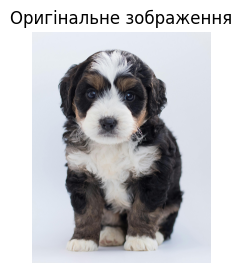

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
На картинці зображено собака із вірогідністю у 99.99%


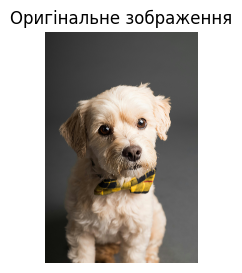

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
На картинці зображено собака із вірогідністю у 100.00%


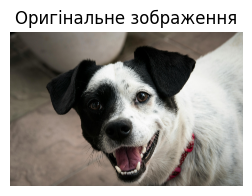

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено собака із вірогідністю у 100.00%


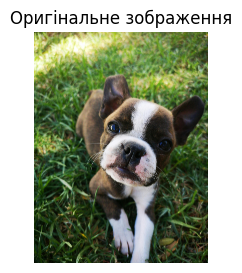

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено собака із вірогідністю у 100.00%


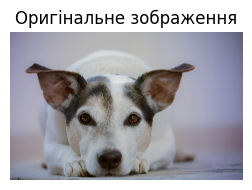

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
На картинці зображено собака із вірогідністю у 98.05%


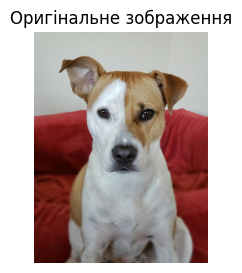

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
На картинці зображено собака із вірогідністю у 99.96%


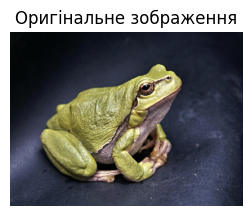

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
На картинці зображено жаба із вірогідністю у 100.00%


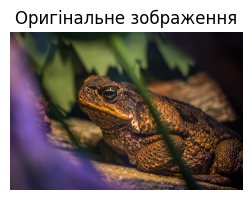

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
На картинці зображено жаба із вірогідністю у 99.96%


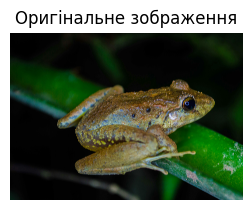

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
На картинці зображено жаба із вірогідністю у 100.00%


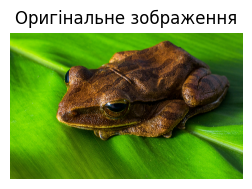

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Впевненість середня (78.07%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


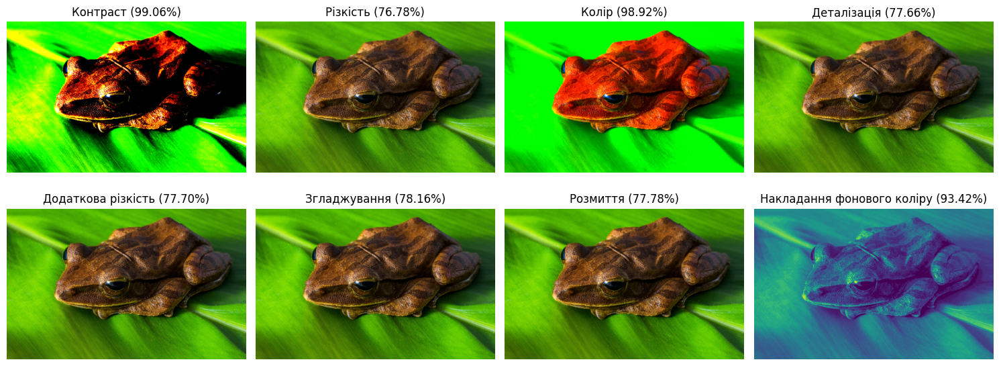

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Фільтр 'Контраст' допоміг: собака із вірогідністю 99.06%


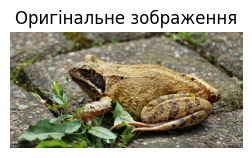

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
На картинці зображено жаба із вірогідністю у 100.00%


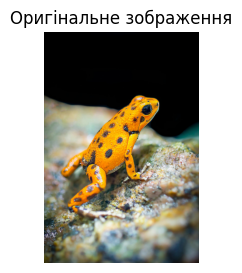

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
На картинці зображено птах із вірогідністю у 98.75%


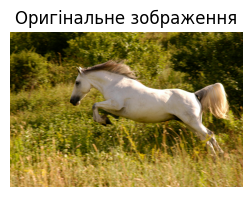

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
На картинці зображено кінь із вірогідністю у 96.65%


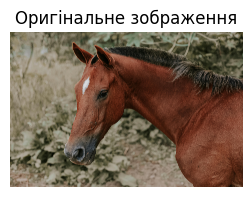

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Впевненість середня (66.31%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


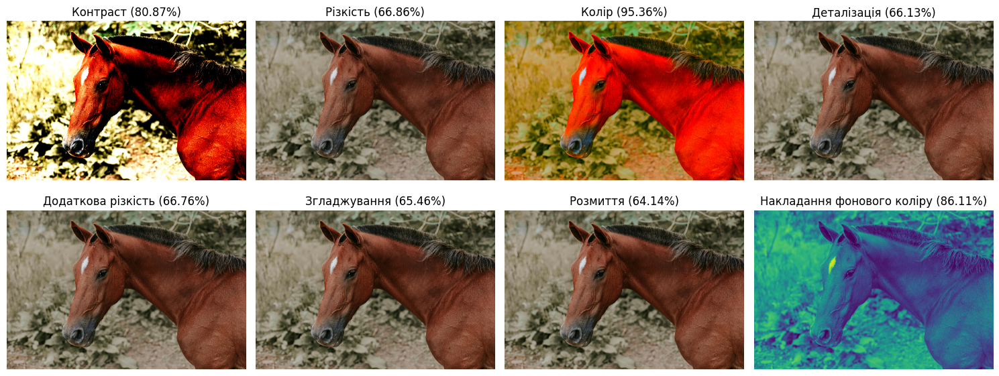

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Фільтр 'Контраст' допоміг: кінь із вірогідністю 80.87%


In [3]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from google.colab import files
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# завантаження збереженої та натренованої ШНМ
model = load_model('/content/drive/MyDrive/model2_vgg16.keras')

# функція попередньої обробки зображення
def preprocess_image(img):
    # конвертація до RGB, якщо потрібно (при чорно-білому форматі)
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img = img.resize((32, 32))  # Зміна розміру до 32x32
    img_array = img_to_array(img)
    img_array = img_array / 255.0
    img_array = np.expand_dims(img_array, axis=0)  #вимір для партії
    return img_array

# функція для додавання Gaussian noise
def add_gaussian_noise(img, mean=0, std=0.1):
    img_array = np.array(img) / 255.0  # нормалізація зображення
    noise = np.random.normal(mean, std, img_array.shape)  # генерація Gaussian noise
    noisy_img_array = np.clip(img_array + noise, 0, 1)  # додавання шуму та обмеження значень
    noisy_img = Image.fromarray((noisy_img_array * 255).astype(np.uint8))  # перетворення назад в зображення
    return noisy_img

# пороги впевненості у прогнозах моделі
confidence_threshold_high = 0.8
confidence_threshold_low = 0.5

# завантаження зображень від користувача через Colab
uploaded = files.upload()

# перебір зображень
for filename in uploaded.keys():
    img = Image.open(filename)

    # виведення оригінального зображення
    plt.figure(figsize=(3, 3))
    plt.imshow(img)
    plt.title("Оригінальне зображення")
    plt.axis('off')
    plt.show()

    # попередня обробка зображення
    img_processed = preprocess_image(img)
    prediction = model.predict(img_processed)

    # отримання прогнозованого класу та впевненості
    predicted_class = np.argmax(prediction)
    confidence = prediction[0][predicted_class]

    # назви класів
    class_labels = ['літак', 'автомобіль', 'птах', 'кішка', 'олень', 'собака', 'жаба', 'кінь', 'корабель', 'вантажівка']

    # перевірка на поріг впевненості (точності)
    if confidence >= confidence_threshold_high:
        print(f'На картинці зображено {class_labels[predicted_class]} із вірогідністю у {confidence * 100:.2f}%')
    elif confidence_threshold_low <= confidence < confidence_threshold_high:
        print(f"Впевненість середня ({confidence * 100:.2f}%). Застосування стандартних фільтрів...")

        # застосування стандартних фільтрів
        filters = [
            ("Контраст", ImageEnhance.Contrast(img).enhance(4)),
            ("Різкість", ImageEnhance.Sharpness(img).enhance(4)),
            ("Колір", ImageEnhance.Color(img).enhance(4)),
            ("Деталізація", img.filter(ImageFilter.DETAIL)),
            ("Додаткова різкість", img.filter(ImageFilter.SHARPEN)),
            ("Згладжування", img.filter(ImageFilter.SMOOTH)),
            ("Розмиття", img.filter(ImageFilter.GaussianBlur(1))),
            ("Накладання фонового коліру", img.convert('L').point(lambda x: x//16*16))
        ]

        # виведення результатів роботи стандартних фільтрів
        fig, axes = plt.subplots(2, 4, figsize=(15, 6))
        axes = axes.flatten()
        for i, (filter_name, filtered_img) in enumerate(filters):
            # Обробка та виведення прогнозу для кожного фільтра
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            confidence = prediction[0][np.argmax(prediction)]

            axes[i].imshow(filtered_img)
            axes[i].set_title(f"{filter_name} ({confidence * 100:.2f}%)")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

        # повторна перевірка для кожного фільтра
        for filter_name, filtered_img in filters:
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            predicted_class = np.argmax(prediction)
            confidence = prediction[0][predicted_class]

            if confidence >= confidence_threshold_high:
                print(f"Фільтр '{filter_name}' допоміг: {class_labels[predicted_class]} із вірогідністю {confidence * 100:.2f}%")
                break
        else:
            print("Зображення не підходить для класифікації навіть після застосування фільтрів.")

    else:
        print(f"Низька впевненість ({confidence * 100:.2f}%). Застосування альтернативних фільтрів...")

        # застосування альтернативних фільтрів (Gaussian noise)
        alternative_filters = [
            ("Gaussian Noise 1", add_gaussian_noise(img, std=0.1)),
            ("Gaussian Noise 2", add_gaussian_noise(img, std=0.3)),
            ("Gaussian Noise 3", add_gaussian_noise(img, std=0.5)),
            ("Gaussian Noise 4", add_gaussian_noise(img, std=0.7)),
            ("Gaussian Noise 5", add_gaussian_noise(img, std=0.9))
        ]

        # виведення результатів роботи альтернативних фільтрів
        fig, axes = plt.subplots(1, 5, figsize=(15, 5))
        axes = axes.flatten()
        for i, (filter_name, filtered_img) in enumerate(alternative_filters):
            # Обробка та виведення прогнозу для кожного фільтра
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            confidence = prediction[0][np.argmax(prediction)]

            axes[i].imshow(filtered_img)
            axes[i].set_title(f"{filter_name} ({confidence * 100:.2f}%)")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

        # повторна перевірка для кожного альтернативного фільтра
        for filter_name, filtered_img in alternative_filters:
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            predicted_class = np.argmax(prediction)
            confidence = prediction[0][predicted_class]

            if confidence >= confidence_threshold_high:
                print(f"Фільтр '{filter_name}' допоміг: {class_labels[predicted_class]} із вірогідністю {confidence * 100:.2f}%")
                break
        else:
            print("Зображення не підходить для класифікації навіть після детальної обробки.")

